In [123]:
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
from sklearn.linear_model import LinearRegression,RidgeCV
from sklearn.model_selection import KFold
import pickle
from scipy.interpolate import interp1d
from sklearn.decomposition import PCA
from tqdm.notebook import tqdm

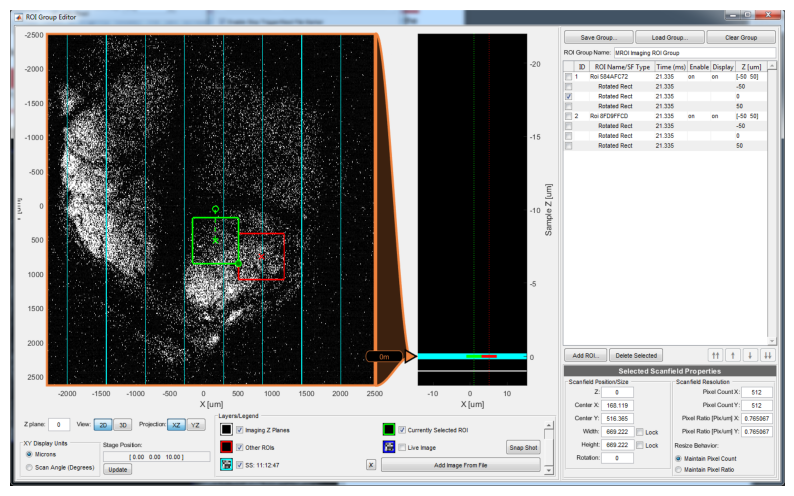

In [124]:
data_folder = "../data/imaging/M11_011224/"
# show the sections (plot png in data_folder)
sections = [f for f in os.listdir(data_folder) if f.endswith(".PNG")]
assert len(sections) == 1, "More/Less than one section found"
section = sections[0]
plt.figure(figsize=(10,10))
plt.imshow(plt.imread(data_folder + section))
plt.axis('off')
plt.show()

In [125]:
# get frame times (only csv in data_folder)
frame_times = [f for f in os.listdir(data_folder) if f.endswith(".csv")]
assert len(frame_times) == 1, "More/Less than one frame time file found"
frame_times = frame_times[0]
frame_times = np.loadtxt(data_folder + frame_times, delimiter=",")
print("Frame times: ", frame_times)

Frame times:  [0.0000e+00 5.3668e-02 1.0734e-01 ... 5.4764e+02 5.4770e+02 5.4775e+02]


In [126]:
# get behavior folder (only folder with "behavior" in data_folder)
behavior_folder = [os.path.join(data_folder, f) for f in os.listdir(data_folder) if "behavior" in f]
assert len(behavior_folder) == 1, "More/Less than one behavior folder found"
behavior_folder = behavior_folder[0]
print("Behavior folder: ", behavior_folder)
# keep only files with "imaging" in behavior_folder
behavior_data = [os.path.join(behavior_folder, f) for f in os.listdir(behavior_folder) if ("imaging" in f and f.endswith(".csv"))]
print("Behavior data: ")
for f in behavior_data:
    print(f)
    
iteration_data = list(filter(lambda x: "Iteration" in x, behavior_data))
assert len(iteration_data) == 1, "More/Less than one iteration data file found"
iteration_data = iteration_data[0]
print("Iteration data: ", iteration_data)
# get iteration data
iteration_data = np.loadtxt(iteration_data, delimiter=",")
print("Iteration data shape: ", iteration_data.shape)

# get trial data
trial_data = list(filter(lambda x: "Trial" in x, behavior_data))
assert len(trial_data) == 1, "More/Less than one trial data file found"
trial_data = trial_data[0]
print("Trial data: ", trial_data)
# get trial data
trial_data = np.loadtxt(trial_data, delimiter=",")
print("Trial data shape: ", trial_data.shape)


Behavior folder:  ../data/imaging/M11_011224/C249376_M11_behavior
Behavior data: 
../data/imaging/M11_011224/C249376_M11_behavior/M11_C249376_01122024_DMS_gonogo_test_lickimaging_TrialData.csv
../data/imaging/M11_011224/C249376_M11_behavior/M11_C249376_01122024_DMS_gonogo_test_lickimaging_IterationData.csv
Iteration data:  ../data/imaging/M11_011224/C249376_M11_behavior/M11_C249376_01122024_DMS_gonogo_test_lickimaging_IterationData.csv
Iteration data shape:  (16116, 17)
Trial data:  ../data/imaging/M11_011224/C249376_M11_behavior/M11_C249376_01122024_DMS_gonogo_test_lickimaging_TrialData.csv
Trial data shape:  (20, 23)


In [127]:
iteration_data = pd.DataFrame(iteration_data, columns=["time", "trial", "air_on", "tone", "stim1", "stim2", "water_left", "water_right", "extend_actuator", "retract_actuator", "synch_pulse", "puff_punishment", "timeout_punishment", "left_lickport_signal", "right_lickport_signal", "go_licks", "nogo_licks"])
iteration_data.head()

,time,trial,air_on,tone,stim1,stim2,water_left,water_right,extend_actuator,retract_actuator,synch_pulse,puff_punishment,timeout_punishment,left_lickport_signal,right_lickport_signal,go_licks,nogo_licks
0,0.00000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.10955,0.13274,0.0,0.0
1,0.12458,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.10955,0.13403,0.0,0.0
2,0.16012,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.10697,0.12888,0.0,0.0
3,0.19359,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.10182,0.12630,0.0,0.0
4,0.22667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.10440,0.12630,0.0,0.0


In [128]:
trial_data = pd.DataFrame(trial_data, columns=["trial", "condition", "delay", "stim1_first", "stim2_first", "stim1_second", "stim2_second", "tone_start", "stim1_start", "delay_start", "stim2_start", "decision_start", "reinforcement_start", "iti_start", "licks_left", "licks_right", "licks_total", "correct", "wrong", "reward", "puff", "timeout", "probe"])
trial_data.head()

,trial,condition,delay,stim1_first,stim2_first,stim1_second,stim2_second,tone_start,stim1_start,delay_start,...,iti_start,licks_left,licks_right,licks_total,correct,wrong,reward,puff,timeout,probe
0,1.0,2.0,5.0,0.0,1.0,1.0,0.0,3.3057,4.5721,7.9405,...,20.181,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2.0,1.0,5.0,1.0,0.0,0.0,1.0,30.1940,31.4630,34.8250,...,47.062,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
2,3.0,4.0,5.0,0.0,1.0,0.0,1.0,57.0630,58.3430,61.7200,...,74.009,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,4.0,2.0,5.0,0.0,1.0,1.0,0.0,84.0210,85.2960,88.6770,...,100.960,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,5.0,2.0,5.0,0.0,1.0,1.0,0.0,110.9600,112.2300,115.5900,...,127.850,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [129]:
recalculation = False

if recalculation or not os.path.exists(data_folder + "all_neural_data.pkl"):
    neural_data = {}
    # get section folders
    section_folders = [os.path.join(data_folder, f) for f in os.listdir(data_folder) if "section" in f and os.path.isdir(os.path.join(data_folder, f))]
    for folder in section_folders:
        name = os.path.basename(folder).split("_")[-1]
        folder = os.path.join(folder, "suite2p")
        print("Section Folder: ")
        print(folder)
        neural_data[name] = {}
        # get planes
        planes = [os.path.join(folder, f) for f in os.listdir(folder) if os.path.isdir(os.path.join(folder, f)) and "plane" in f]
        print("Planes for {}: ".format(name))
        for x, plane in enumerate(planes):
            print(plane)
            neural_data[name][os.path.basename(plane)] = {}
            # get cell data
            cell_data = np.load(os.path.join(plane, "F.npy"))
            neural_data[name][os.path.basename(plane)]["F"] = cell_data
            # get neuropil data
            neuropil_data = np.load(os.path.join(plane, "Fneu.npy"))
            neural_data[name][os.path.basename(plane)]["Fneu"] = neuropil_data
            # get spike data
            spike_data = np.load(os.path.join(plane, "spks.npy"))
            neural_data[name][os.path.basename(plane)]["spks"] = spike_data
            # get ops and stat data
            ops = np.load(os.path.join(plane, "ops.npy"), allow_pickle=True).item()
            neural_data[name][os.path.basename(plane)]["ops"] = ops
            stat = np.load(os.path.join(plane, "stat.npy"), allow_pickle=True)
            neural_data[name][os.path.basename(plane)]["stat"] = stat
            # get frame info (de-interleave)
            neural_data[name][os.path.basename(plane)]["time"] = frame_times[x::len(planes)]
    
    rolling_window = 0.1 
    for section in neural_data.keys():
        for plane in neural_data[section].keys():
            print("Calculating {} {}".format(section, plane))
            F = neural_data[section][plane]["F"]
            Fneu = neural_data[section][plane]["Fneu"]
            # get neuropil corrected data
            Fcorr = F - 0.7 * Fneu
            # get rolling window median (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5338622/)
            Fmedian = []
            for x in range(Fcorr.shape[0]):
                # get rolling window size
                window = int(rolling_window * Fcorr.shape[1])//2
                rolling = []
                for t in range(Fcorr.shape[1]):
                    start = max(0, t - window)
                    end = min(Fcorr.shape[1], t + window)
                    rolling.append(np.median(Fcorr[x, start:end]))
                Fmedian.append(rolling)
            Fmedian = np.array(Fmedian)
            # get dfof
            dfof = ((Fcorr - Fmedian).T/(Fcorr.max(axis=1) - Fcorr.min(axis=1))).T
            neural_data[section][plane]["dfof"] = dfof
            
    # save neural data
    with open(data_folder + "all_neural_data.pkl", "wb") as f:
        pickle.dump(neural_data, f)
else:
    with open(data_folder + "all_neural_data.pkl", "rb") as f:
        neural_data = pickle.load(f)

In [130]:
# combine all dfof
dfof = []
counts = []
for section in neural_data.keys():
    for plane in neural_data[section].keys():
        dfof.append(neural_data[section][plane]["dfof"])
        counts.append(neural_data[section][plane]["dfof"].shape[0])
# get minimum time length
min_time = min([x.shape[1] for x in dfof])
dfof = np.concatenate([x[:, :min_time] for x in dfof], axis=0)
print("dfof shape: ", dfof.shape)

dfof shape:  (448, 3402)


In [132]:
#save as npy
np.save(data_folder + "dfof.npy", dfof)

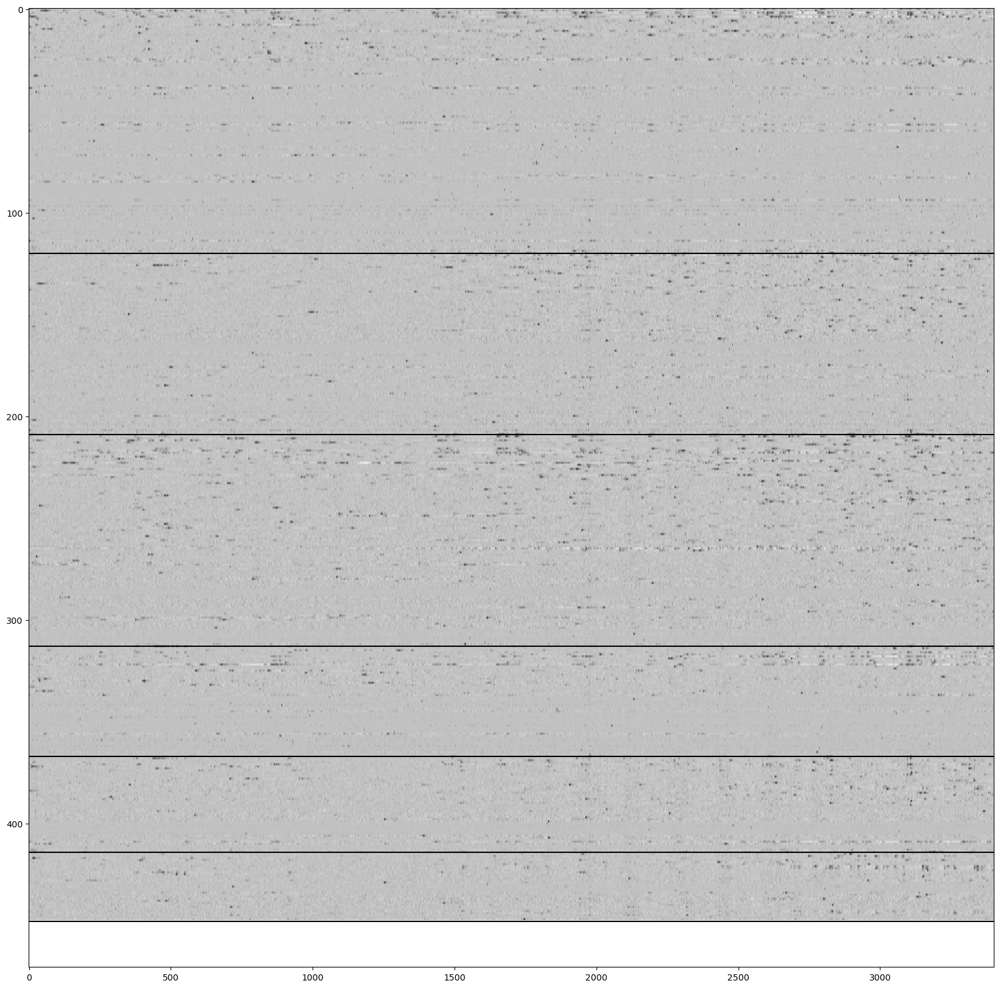

In [131]:
# plot as a heatmap
plt.figure(figsize=(20,20))
plt.imshow(dfof, aspect="auto", cmap="gray_r")
# add lines at counts
for c in np.cumsum(counts):
    plt.axhline(c, color="black")
plt.show()

In [109]:
# create function to align to times
def align_to_times(times,surrounding_range=(-1,1),resolution=0.05,return_extras=False):
    # generate time range
    time_range = np.arange(surrounding_range[0], surrounding_range[1], resolution)
    
    # loop over all neurons
    all_aligned_dfofs = []
    for section in neural_data.keys():
        for plane in neural_data[section].keys():
            print("Aligning {} {}".format(section, plane))
            # get dfof
            all_dfof = neural_data[section][plane]["dfof"]
            # get time
            time = neural_data[section][plane]["time"]
            # loop over neurons
            for n in range(all_dfof.shape[0]):
                # get neuron dfof
                dfof = all_dfof[n, :]
                # get trial aligned dfof
                aligned_dfofs = []
                # loop over trials
                for t in trial_start_times:
                    # get time points
                    time_points = t + time_range
                    # get dfof points
                    less_than_0 = np.sum(time_points < min(time))
                    more_than_end = np.sum(time_points > max(time))
                    time_points = time_points[(time_points >= min(time)) & (time_points <= max(time))]

                    dfof_points = interp1d(time, dfof, kind="linear")(time_points)
                    dfof_points = np.concatenate([np.zeros(less_than_0), dfof_points, np.zeros(more_than_end)])

                    # append to trial aligned dfof
                    aligned_dfofs.append(dfof_points)
                # get average dfof
                all_aligned_dfofs.append(np.array(aligned_dfofs))
    all_aligned_dfofs = np.array(all_aligned_dfofs)
    if return_extras:
        return all_aligned_dfofs, time_range
    else:
        return all_aligned_dfofs

# define a function perform PCA based sorting and plot the results
def pca_sorting(data, time_range, n_dims=5):
    pca = PCA(n_components=n_dims)
    pca.fit(data)
    print("PCA Explained Variance: ", np.cumsum(pca.explained_variance_ratio_)*100)
    pcs = pca.transform(data)
    fig, ax = plt.subplots(1, n_dims, figsize=(5*n_dims, 10))
    for i in range(n_dims):
        sorted_pcs = np.argsort(pcs[:, i])
        sorted_dfof = data[sorted_pcs, :]
        ax[i].imshow(sorted_dfof, aspect="auto", cmap="gray_r")
        # draw vertical line at 0
        ax[i].axvline(np.where(np.round(time_range, 2) == 0)[0][0], color="red")
        ax[i].set_xticks(np.arange(len(time_range))[::4])
        ax[i].set_xticklabels(np.round(time_range[::4], 2))
        ax[i].set_xlabel("Time (s)")
        ax[i].set_ylabel("Neuron")
        ax[i].set_title("PC {} (Explained Variance: {:.2f}%)".format(i+1, np.cumsum(pca.explained_variance_ratio_)[i]*100))
    plt.suptitle("PCA Sorted dF/F")
    plt.tight_layout()
    plt.show()

# define a function to sort by pre-post effect size
def pre_post_sorting(data, time_range):
    def cohens_d(x, y):
        nx = len(x)
        ny = len(y)
        dof = nx + ny - 2
        return (np.mean(x) - np.mean(y)) / np.sqrt(((nx-1)*np.var(x) + (ny-1)*np.var(y)) / dof)
    # get pre and post dfof
    nbefore = np.where(np.round(time_range, 2) == 0)[0][0]
    pre = data[:,:,:nbefore+1].reshape(data.shape[0], -1)
    post = data[:,:,nbefore+1:].reshape(data.shape[0], -1)
    effect_size = []
    for i in range(pre.shape[0]):
        effect_size.append(cohens_d(pre[i, :], post[i, :]))
    effect_size = np.array(effect_size)
    # sort by effect size and plot
    sorted_effect_size = np.argsort(effect_size)
    sorted_dfof = data.mean(axis=1)[sorted_effect_size, :]
    plt.figure(figsize=(5,5))
    plt.imshow(sorted_dfof, aspect="auto", cmap="gray_r")
    plt.axvline(nbefore, color="red")
    plt.xticks(np.arange(len(time_range))[::4], np.round(time_range[::4], 2))
    plt.xlabel("Time (s)")
    plt.ylabel("Neuron")
    plt.title("Effect Size Sorted dF/F")
    plt.show()

# define a function to sort by smoothed peak
def peak_sorting(data, time_range, window=0.1):
    # for each neuron, get the smoothed peak
    smoothed_peaks = []
    for i in range(data.shape[0]):
        across_trial_peaks_position = []
        across_trial_peaks_height = []
        for t in range(data.shape[1]):
            # get smoothed dfof
            smoothed = np.convolve(data[i, t, :], np.ones(int(window/0.05)), mode="same")
            # get peak position
            peak = np.argmax(smoothed)
            across_trial_peaks_position.append(peak)
            across_trial_peaks_height.append(smoothed[peak])
        # get weighted peak position
        peak = np.average(across_trial_peaks_position, weights=across_trial_peaks_height)
        smoothed_peaks.append(peak)
    # sort by peak position and plot
    sorted_peaks = np.argsort(smoothed_peaks)
    sorted_dfof = data.mean(axis=1)[sorted_peaks, :]
    plt.figure(figsize=(5,5))
    plt.imshow(sorted_dfof, aspect="auto", cmap="gray_r")
    plt.axvline(np.where(np.round(time_range, 2) == 0)[0][0], color="red")
    plt.xticks(np.arange(len(time_range))[::4], np.round(time_range[::4], 2))
    plt.xlabel("Time (s)")
    plt.ylabel("Neuron")
    plt.title("Peak Position Sorted dF/F")
    plt.show()

Aligning section1 plane0
Aligning section1 plane1
Aligning section1 plane2
Aligning section2 plane0
Aligning section2 plane1
Aligning section2 plane2
PCA Explained Variance:  [47.49976504 58.79986239 66.57496304 71.73058264 75.78083013]


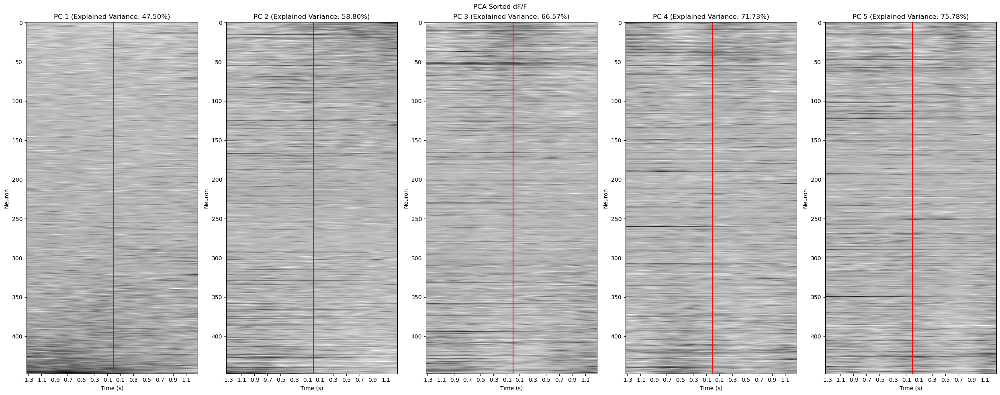

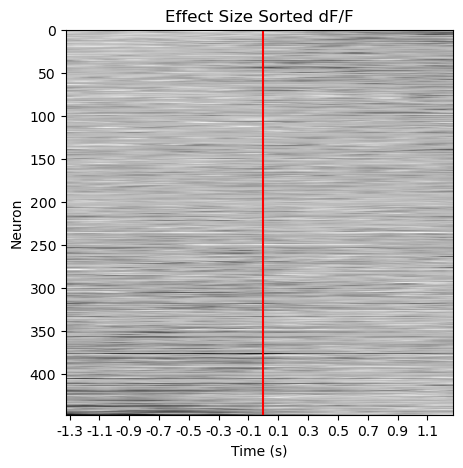

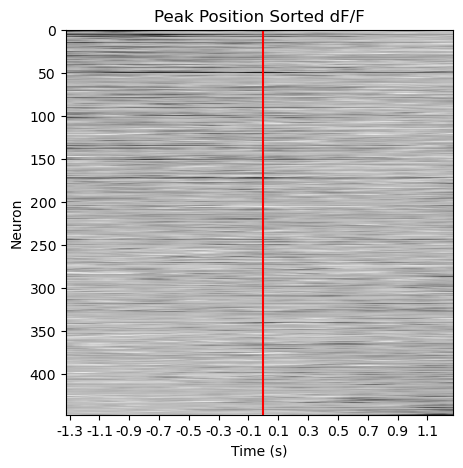

In [133]:
# get trial start times
times = trial_data["tone_start"].values
surrounding_range = (-1.3, 1.3)
resolution = 0.05

# align to times
aligned_dfofs, time_range = align_to_times(times, surrounding_range=surrounding_range, resolution=resolution, return_extras=True)
# average aligned dfofs across trials
aligned_avg_dfofs = np.mean(aligned_dfofs, axis=1)

# perform PCA based sorting
pca_sorting(aligned_avg_dfofs, time_range, n_dims=5)

# perform pre-post effect size sorting
pre_post_sorting(aligned_dfofs, time_range)

# perform peak sorting
peak_sorting(aligned_dfofs, time_range, window=0.5)

Aligning section1 plane0
Aligning section1 plane1
Aligning section1 plane2
Aligning section2 plane0
Aligning section2 plane1
Aligning section2 plane2
PCA Explained Variance:  [26.07811688 36.12327016 45.1969767  51.37336382 56.35882444]


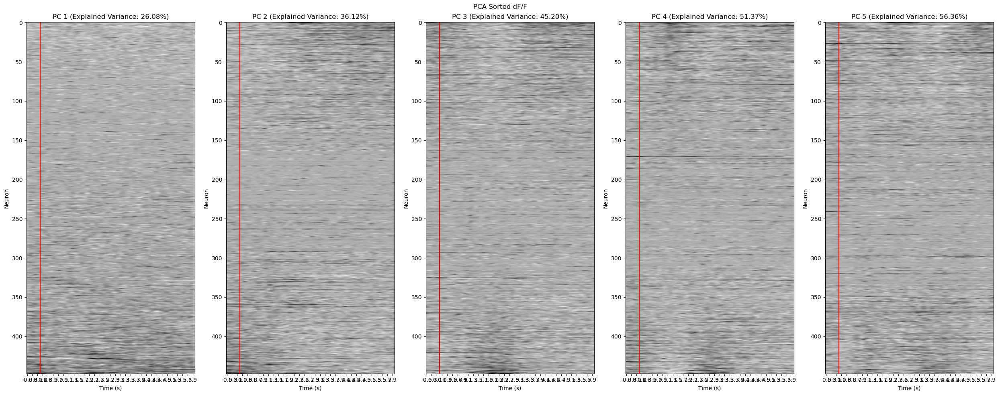

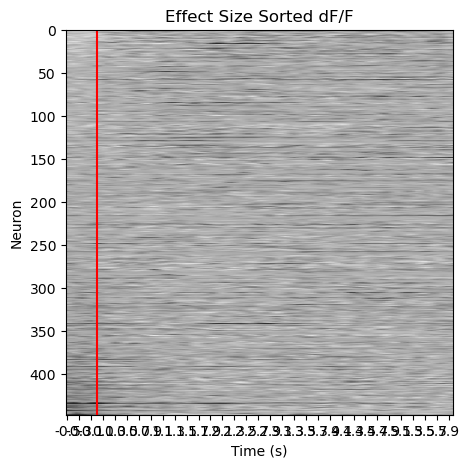

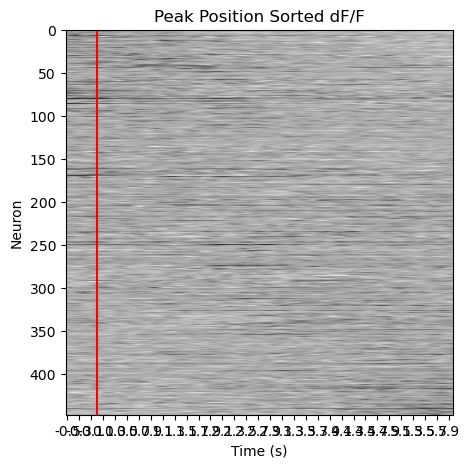

In [134]:
# get stim1 first odor start times
times = trial_data["stim1_start"].values
times = times[trial_data["stim1_first"].values == 1]
surrounding_range = (-0.5, 6)
resolution = 0.05

# align to times
aligned_dfofs, time_range = align_to_times(times, surrounding_range=surrounding_range, resolution=resolution, return_extras=True)
# average aligned dfofs across trials
aligned_avg_dfofs = np.mean(aligned_dfofs, axis=1)

# perform PCA based sorting
pca_sorting(aligned_avg_dfofs, time_range, n_dims=5)

# perform pre-post effect size sorting
pre_post_sorting(aligned_dfofs, time_range)

# perform peak sorting
peak_sorting(aligned_dfofs, time_range, window=0.5)

# Regression Model

In [112]:
# make time series
resolution = 0.05
start = 0
end = int(max(frame_times)/resolution)*resolution + resolution
time_series = np.arange(start, end, resolution)
print("Time series shape: ", time_series.shape)

Time series shape:  (10956,)


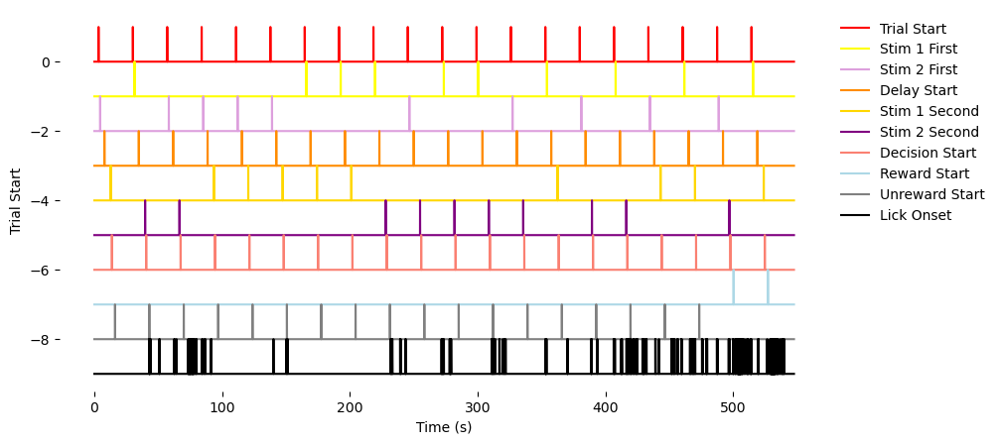

Task Variables Shape:  (10956, 10)


In [113]:
# generate task variables

# trial start
trial_start_times = np.int32(trial_data["tone_start"].values/resolution)*resolution
trial_start_times_vec = np.zeros_like(time_series)
for t in trial_start_times:
    trial_start_times_vec[np.where(time_series == t)[0][0]] = 1

# stimulus 1 (high+banana) presented first and filter out trials where stimulus 2 was presented first
stim1_first_stimulus = trial_data["stim1_start"].values
stim1_first_stimulus = stim1_first_stimulus[trial_data["stim1_first"].values == 1]
stim1_first_stimulus = np.int32(stim1_first_stimulus/resolution)*resolution
stim1_first_stimulus_vec = np.zeros_like(time_series)
for t in stim1_first_stimulus:
    stim1_first_stimulus_vec[np.where(time_series == t)[0][0]] = 1
# stimulus 2 (low+lavender) presented first and filter out trials where stimulus 1 was presented first
stim2_first_stimulus = trial_data["stim1_start"].values
stim2_first_stimulus = stim2_first_stimulus[trial_data["stim2_first"].values == 1]
stim2_first_stimulus = np.int32(stim2_first_stimulus/resolution)*resolution
stim2_first_stimulus_vec = np.zeros_like(time_series)
for t in stim2_first_stimulus:
    stim2_first_stimulus_vec[np.where(time_series == t)[0][0]] = 1
# stimulus 1 (high+banana) presented second and filter out trials where stimulus 2 was presented second
stim1_second_stimulus = trial_data["stim2_start"].values
stim1_second_stimulus = stim1_second_stimulus[trial_data["stim1_second"].values == 1]
stim1_second_stimulus = np.int32(stim1_second_stimulus/resolution)*resolution
stim1_second_stimulus_vec = np.zeros_like(time_series)
for t in stim1_second_stimulus:
    stim1_second_stimulus_vec[np.where(time_series == t)[0][0]] = 1
# stimulus 2 (low+lavender) presented second and filter out trials where stimulus 1 was presented second
stim2_second_stimulus = trial_data["stim2_start"].values
stim2_second_stimulus = stim2_second_stimulus[trial_data["stim2_second"].values == 1]
stim2_second_stimulus = np.int32(stim2_second_stimulus/resolution)*resolution
stim2_second_stimulus_vec = np.zeros_like(time_series)
for t in stim2_second_stimulus:
    stim2_second_stimulus_vec[np.where(time_series == t)[0][0]] = 1

# delay start
delay_start_times = np.int32(trial_data["delay_start"].values/resolution)*resolution
delay_start_times_vec = np.zeros_like(time_series)
for t in delay_start_times:
    delay_start_times_vec[np.where(time_series == t)[0][0]] = 1

# decision start
decision_start_times = np.int32(trial_data["decision_start"].values/resolution)*resolution
decision_start_times_vec = np.zeros_like(time_series)
for t in decision_start_times:
    decision_start_times_vec[np.where(time_series == t)[0][0]] = 1

# reinforcement start (rewarded)
reward_start_times = np.int32(trial_data["reinforcement_start"].values[trial_data["reward"].values == 1.0]/resolution)*resolution
reward_start_times_vec = np.zeros_like(time_series)
for t in reward_start_times:
    reward_start_times_vec[np.where(time_series == t)[0][0]] = 1

# reinforcement start (not rewarded)
unreward_start_times = np.int32(trial_data["reinforcement_start"].values[trial_data["reward"].values == 0.0]/resolution)*resolution
unreward_start_times_vec = np.zeros_like(time_series)
for t in unreward_start_times:
    unreward_start_times_vec[np.where(time_series == t)[0][0]] = 1

# lick onset
lick_onset_times = iteration_data["time"].values[:-1][np.logical_and(iteration_data["left_lickport_signal"].values[:-1] < 3, iteration_data["left_lickport_signal"].values[1:] >= 3)]
lick_onset_times = np.int32(lick_onset_times/resolution)*resolution
lick_onset_times_vec = np.zeros_like(time_series)
for t in lick_onset_times:
    lick_onset_times_vec[np.where(time_series == t)[0][0]] = 1
    
plt.figure(figsize=(10,5))
plt.plot(time_series, trial_start_times_vec, label="Trial Start", color="red")
plt.plot(time_series, -1 + stim1_first_stimulus_vec, label="Stim 1 First", color="yellow")
plt.plot(time_series, -2 + stim2_first_stimulus_vec, label="Stim 2 First", color="plum")
plt.plot(time_series, -3 + delay_start_times_vec, label="Delay Start", color="darkorange")
plt.plot(time_series, -4 + stim1_second_stimulus_vec, label="Stim 1 Second", color="gold")
plt.plot(time_series, -5 + stim2_second_stimulus_vec, label="Stim 2 Second", color="purple")
plt.plot(time_series, -6 + decision_start_times_vec, label="Decision Start", color="salmon")
plt.plot(time_series, -7 + reward_start_times_vec, label="Reward Start", color="lightblue")
plt.plot(time_series, -8 + unreward_start_times_vec, label="Unreward Start", color="gray")
plt.plot(time_series, -9 + lick_onset_times_vec, label="Lick Onset", color="black")
plt.xlabel("Time (s)")
plt.ylabel("Trial Start")
plt.box(False)
plt.legend(loc="upper left", bbox_to_anchor=(1,1), frameon=False)
plt.show()

# combine all task variables
task_variables = np.stack([trial_start_times_vec, stim1_first_stimulus_vec, stim2_first_stimulus_vec, delay_start_times_vec, stim1_second_stimulus_vec, stim2_second_stimulus_vec, decision_start_times_vec, reward_start_times_vec, unreward_start_times_vec, lick_onset_times_vec], axis=1)
print("Task Variables Shape: ", task_variables.shape)
task_variable_names = ["Trial Start", "Stim 1 First", "Stim 2 First", "Delay Start", "Stim 1 Second", "Stim 2 Second", "Decision Start", "Reward Start", "Unreward Start", "Lick Onset"]
task_colors = ["red", "limegreen", "plum", "darkorange", "green", "purple", "salmon", "lightblue", "gray", "black"]


In [114]:
var_to_keep_and_range = [
    ('Trial Start',(-1,1)),
    ('Stim 1 First',(-0.3,8)),
    ('Stim 2 First',(-0.3,8)),
    ('Stim 1 Second',(-0.4,3.0)),
    ('Stim 2 Second',(-0.4,3.0)),
    ('Reward Start',(-0.4,4.0)),
    ('Unreward Start',(-0.4,4.0)),
    ('Lick Onset',(-1,1)),
]
# remove the task variables that are not in var_to_keep_and_range
task_indices = [i for i in range(len(task_variable_names)) if task_variable_names[i] in [x[0] for x in var_to_keep_and_range]]
task_variables = task_variables[:, task_indices]
task_variable_names = [task_variable_names[i] for i in task_indices]
task_colors = [task_colors[i] for i in task_indices]
print("Task Variables Shape: ", task_variables.shape)

Task Variables Shape:  (10956, 8)


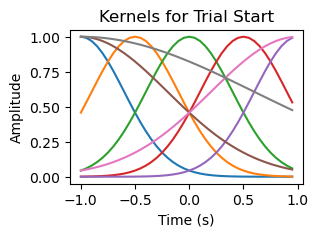

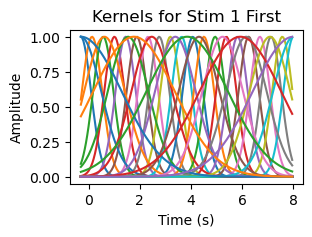

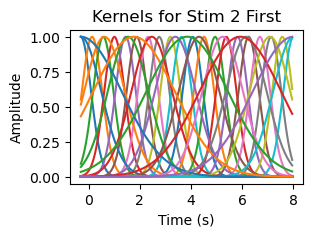

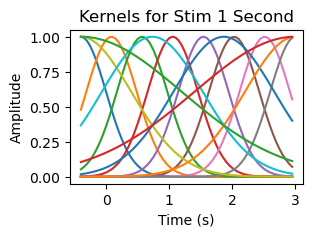

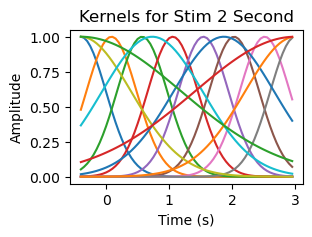

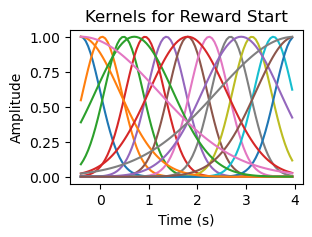

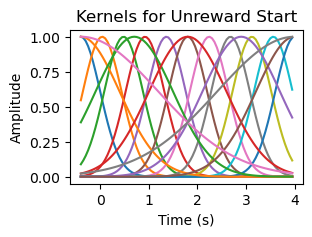

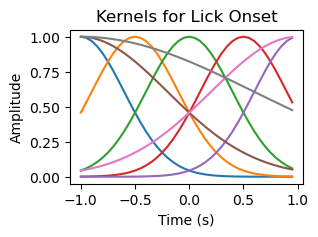

In [115]:
# create a function to generate kernels
def generate_kernels(regression_range, sigmas, resolution=0.05, return_extras=False):
    # we are gonna use gaussian kernels
    def gaussian_kernel(x, mu, sigma):
        return np.exp(-0.5*((x - mu)/sigma)**2)
    # create time points
    regression_timeseries = np.arange(regression_range[0], regression_range[1], resolution)
    n_before = np.sum(regression_timeseries < 0)
    sigmas = np.array(sigmas)*resolution
    kernels = []
    for s in sigmas:
        # uniformly distributed in range with sigma separation
        mus = np.linspace(regression_range[0], regression_range[1], int((regression_range[1] - regression_range[0])/s))
        for i, mu in enumerate(mus):
            kernels.append(gaussian_kernel(regression_timeseries, mu, s))
    kernels = np.array(kernels).T
    if return_extras:
        return kernels, regression_timeseries, n_before
    else:
        return kernels
    
# generate kernels for each task variable
sigmas = [8, 16, 32]
all_kernels = []
regression_timeserieses = []
n_befores = []
for i in range(task_variables.shape[1]):
    regression_range = var_to_keep_and_range[i][1]
    kernels, regression_timeseries, n_before = generate_kernels(regression_range, sigmas, resolution=resolution, return_extras=True)
    all_kernels.append(kernels)
    n_befores.append(n_before)
    regression_timeserieses.append(regression_timeseries)

    # plot the kernels
    plt.figure(figsize=(3,2))
    plt.plot(regression_timeseries, kernels)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title("Kernels for {}".format(task_variable_names[i]))
    plt.show()

# get total kernels
n_kernels = np.sum([x.shape[1] for x in all_kernels])


In [116]:
# apply kernels to task variables
task_variables_convolved = np.zeros((task_variables.shape[0], n_kernels))
kernel_idx = 0
for i in range(task_variables.shape[1]):
    n_before = n_befores[i]
    for j in range(all_kernels[i].shape[1]):
        # print("Convolving {} kernel ({} o f {})".format(task_variable_names[i], j+1, all_kernels[i].shape[1]))
        task_variables_convolved[:, kernel_idx] = np.convolve(task_variables[:, i], all_kernels[i][:,j], mode="full")[n_before:n_before+len(time_series)]
        kernel_idx += 1

In [117]:
# create regression matrix
X = np.array(task_variables_convolved)
print("X shape: ", X.shape)

# create ys
ys = []
for section in neural_data.keys():
    for plane in neural_data[section].keys():
        time = neural_data[section][plane]["time"]
        for cell in range(neural_data[section][plane]["dfof"].shape[0]):
            dfof = neural_data[section][plane]["dfof"][cell, :]
            y = interp1d(time, dfof, kind="linear", fill_value="extrapolate")(time_series)
            ys.append(y)

task_kernel_counts = [x.shape[1] for x in all_kernels]
print("Task Kernel Counts: ", task_kernel_counts)

X shape:  (10956, 150)
Task Kernel Counts:  [8, 35, 35, 14, 14, 18, 18, 8]


In [75]:
X.shape, len(ys)

((10956, 150), 448)

In [50]:
class customRegularizationLinearModel:
    def __init__(self, kernel_counts, l1_reg=0.0, l2_reg=0.0, algo="shgo"):
        self.l1_reg = l1_reg
        self.l2_reg = l2_reg
        self.coefs = None
        self.intercept = None
        self.X = None
        self.y = None
        self.kernel_counts = kernel_counts
        assert algo in ["shgo", "differential_evolution", "dual_annealing", "L-BFGS-B"], "Invalid optimization algorithm"
        self.algo = algo


    def _loss(self, params):
        # get coefficients and intercept
        coefs = params[:-1]
        intercept = params[-1]
        y_hat = intercept + np.dot(self.X, coefs)
        # MSE Loss
        loss = np.mean((self.y - y_hat)**2)
        # L2 Regularization
        loss += self.l2_reg*np.sum(self.coefs**2)
        # L1 Regularization
        split_coefs = np.split(self.coefs, np.cumsum(self.kernel_counts)[:-1])
        mean_split_coefs = np.array([np.sqrt(np.mean(x**2)) for x in split_coefs])
        loss += self.l1_reg*np.sum(mean_split_coefs)
        return loss
    
    def _jac(self, params):
        # get coefficients and intercept
        coefs = params[:-1]
        intercept = params[-1]
        # get derivative of loss with respect to coefficients
        y_hat = intercept + np.dot(self.X, coefs)
        # derivative of loss with respect to coefficients
        d_loss_d_coefs = -2*np.dot(self.X.T, (self.y - y_hat))
        # derivative of loss with respect to intercept
        d_loss_d_intercept = -2*np.sum(self.y - y_hat)
        # L2 Regularization
        d_loss_d_coefs += 2*self.l2_reg*self.coefs
        # L1 Regularization
        split_coefs = np.split(self.coefs, np.cumsum(self.kernel_counts)[:-1])
        mean_split_coefs = np.array([np.sqrt(np.mean(x**2)) for x in split_coefs])
        # repeat each value in mean_split_coefs by the number of elements in the corresponding split_coefs
        mean_split_coefs = np.repeat(mean_split_coefs, [len(x) for x in split_coefs])
        # derivative of L1 Regularization
        d_loss_d_coefs += self.l1_reg*coefs/mean_split_coefs 
        return np.concatenate([d_loss_d_coefs, [d_loss_d_intercept]])

    def predict(self, X):
        return self.intercept + np.dot(X, self.coefs)
    
    def fit(self, X, y):
        self.X = X
        self.y = y
        # get number of features
        n_features = X.shape[1]
        # initialize coefficients
        self.coefs = np.random.randn(n_features)
        # initialize intercept
        self.intercept = 0
        # fit coefficients using optimization
        self.coefs, self.intercept = self._optimize(X, y)
        return self
    
    def _optimize(self, X, y): 
        from scipy.optimize import shgo,minimize,dual_annealing,differential_evolution
        # get initial guess
        x0 = np.concatenate([self.coefs, [self.intercept]])
        # get bounds
        bounds = [(None, None) for _ in range(X.shape[1])]
        bounds.append((None, None))
        # minimize loss
        if self.algo == "shgo":
            res = shgo(self._loss, bounds)
        elif self.algo == "differential_evolution":
            res = differential_evolution(self._loss, bounds)
        elif self.algo == "dual_annealing":
            res = dual_annealing(self._loss, bounds)
        elif self.algo == "L-BFGS-B":
            res = minimize(self._loss, x0, bounds=bounds, method="L-BFGS-B")
        # get coefficients
        coefs = res.x[:-1]
        intercept = res.x[-1]
        return coefs, intercept

# test the model
model = customRegularizationLinearModel(task_kernel_counts, l1_reg=0.0, l2_reg=0.0, algo="L-BFGS-B")
model.fit(X, ys[206])


Text(0.5, 0, 'Time (s)')

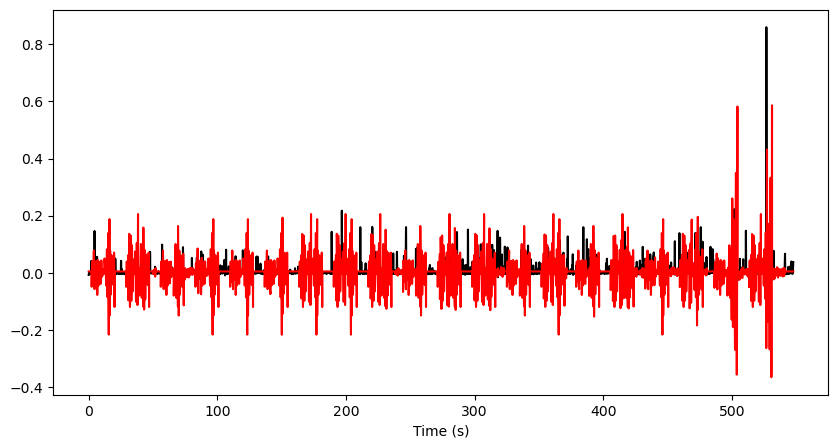

In [51]:
# plot prediction
plt.figure(figsize=(10,5))
plt.plot(time_series, ys[206], label="True", color="black")
plt.plot(time_series, model.predict(X), label="Predicted", color="red")
plt.xlabel("Time (s)")

In [20]:
import torch

In [27]:
class NeuralTaskRegression:
    def __init__(self, task_kernel_counts, l1=0.1, l2=0.1, smoothness=0.1, lr=0.01, epochs=1000, batch_size=1000, verbose=True, patience=np.inf,train_val_split=0.99):
        self.task_kernel_counts = task_kernel_counts
        self.l1 = l1
        self.l2 = l2
        self.smoothness = smoothness
        self.lr = lr
        self.epochs = epochs
        self.batch_size = batch_size
        self.coefs_ = None
        self.intercept_ = None
        self.verbose = verbose
        self.patience = patience
        self.train_val_split = train_val_split

    def fit(self, X, y):
        # initialize coefs and intercept
        coefs_ = torch.randn(X.shape[1], requires_grad=True)
        intercept_ = torch.randn(1, requires_grad=True)
        # optimizer
        optimizer = torch.optim.Adam([coefs_, intercept_], lr=self.lr)
        # split into train, validation
        # randomize
        indices = np.random.permutation(X.shape[0])
        X, y = X[indices], y[indices]
        X_train, X_val = X[:int(self.train_val_split*X.shape[0])], X[int(self.train_val_split*X.shape[0]):]
        y_train, y_val = y[:int(self.train_val_split*X.shape[0])], y[int(self.train_val_split*X.shape[0]):]

        # convert to tensor
        X_val = torch.tensor(X_val, dtype=torch.float32)
        y_val = torch.tensor(y_val, dtype=torch.float32).reshape(-1, 1)
        
        # setup patience and prev_loss
        prev_loss = float("inf")
        current_patience = 0
        best_coefs = None
        best_intercept = None

        # start training
        for i in range(self.epochs):
            for j in range(0, X_train.shape[0], self.batch_size):
                # convert to tensor and get batch
                X_batch = torch.tensor(X_train[j:j+self.batch_size], dtype=torch.float32)
                y_batch = torch.tensor(y_train[j:j+self.batch_size], dtype=torch.float32).reshape(-1, 1)
                # get predictions
                preds = torch.matmul(X_batch, coefs_) + intercept_
                # get loss
                mse_loss = torch.mean((preds - y_batch)**2)
                kernel_coefs = torch.split(coefs_, tuple(self.task_kernel_counts))
                # get mse for each task variable
                l1_loss = sum([torch.mean(torch.pow(x, 2)) for x in kernel_coefs])
                l2_loss = torch.mean(torch.pow(coefs_, 2))
                smoothness_loss = sum([torch.mean(torch.pow(kernel_coefs[i][1:] - kernel_coefs[i][:-1], 2)) for i in range(len(kernel_coefs))])
                loss = mse_loss + self.l1*l1_loss + self.l2*l2_loss + self.smoothness*smoothness_loss
                # zero gradients
                optimizer.zero_grad()
                # backward pass
                loss.backward()
                # step
                optimizer.step()
            # get validation loss
            preds = torch.matmul(X_val, coefs_) + intercept_
            mse_loss = torch.mean((preds - y_val)**2)
            if self.verbose:
                print("Epoch: {} | Train Loss: {:.2f} | Val Loss: {:.2f}".format(i, loss, mse_loss))
            # early stopping
            if mse_loss < prev_loss:
                prev_loss = mse_loss
                current_patience = 0
                best_coefs = coefs_.detach().clone()
                best_intercept = intercept_.detach().clone()
            else:
                current_patience += 1
                if current_patience == self.patience:
                    # set coefs and intercept to best
                    coefs_ = best_coefs
                    intercept_ = best_intercept
                    break
        # set coefs and intercept
        self.coefs_ = coefs_.detach().numpy()
        self.intercept_ = intercept_.detach().numpy()

    def predict(self, X):
        return np.matmul(X, self.coefs_) + self.intercept_
    
    def score(self, X, y):
        # calculate r2
        preds = self.predict(X)
        ssr = np.sum((preds - y)**2)
        sst = np.sum((y - np.mean(y))**2)
        return 1 - (ssr/sst)
    
    def get_params(self):
        return {"l1": self.l1, "l2": self.l2, "lr": self.lr, "epochs": self.epochs, "batch_size": self.batch_size}
    
    def set_params(self, **params):
        self.l1 = params["l1"]
        self.l2 = params["l2"]
        self.lr = params["lr"]
        self.epochs = params["epochs"]
        self.batch_size = params["batch_size"]

In [42]:
# create and fit the model
model = NeuralTaskRegression(task_kernel_counts, l1=0.0, l2=0.0,smoothness=0.0, lr=0.01, epochs=40, batch_size=100, verbose=True)

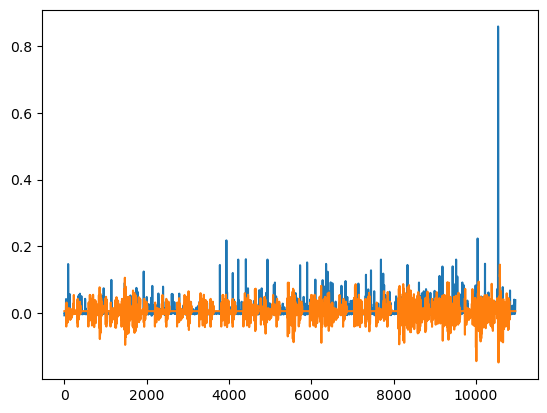

In [44]:
cell_id = 206
plt.plot(ys[cell_id])
model.fit(X, ys[cell_id])
plt.plot(model.predict(X))


In [76]:
from sklearn.linear_model import ElasticNetCV, ElasticNet,RidgeCV, Ridge

In [79]:
recalculation = True

if recalculation or not (os.path.exists("neuron_models.pkl") and os.path.exists("neuron_scores.pkl")):
    neuron_models = []
    neuron_scores = []
    for y in tqdm(ys):
        # perform Linear Regression with 5-fold cross validation
        model = RidgeCV(alphas=np.logspace(-6, 6, 13), cv=5)
        # fit model
        model.fit(X, y)
        # # print coefficients
        # print("Best Alpha: ", model.alpha_)
        # print("Best Coefficients: ", model.coef_)
        # get best model
        model = Ridge(alpha=model.alpha_)
        model.fit(X, y)
        neuron_models.append(model)
        neuron_scores.append(model.score(X, y))
        
        # scores = []
        # models = []
        # for train_index, test_index in kf.split(X):
        #     X_train, X_test = X[train_index], X[test_index]
        #     y_train, y_test = y[train_index], y[test_index]
        #     model.fit(X_train, y_train)
        #     models.append(model)
        #     scores.append(model.score(X, y))
        # # create average model
        # model = ElasticNet(l1_ratio=model.l1_ratio_, alpha=model.alpha_)
        # model.coef_ = np.array([x.coef_ for x in models]).mean(axis=0)
        # model.intercept_ = np.array([x.intercept_ for x in models]).mean()
        # neuron_models.append(model)
        # neuron_scores.append(scores)
    neuron_scores = np.array(neuron_scores)

    # save models and scores
    with open("neuron_models.pkl", "wb") as f:
        pickle.dump(neuron_models, f)
    with open("neuron_scores.pkl", "wb") as f:
        pickle.dump(neuron_scores, f)
else:
    with open("neuron_models.pkl", "rb") as f:
        neuron_models = pickle.load(f)
    with open("neuron_scores.pkl", "rb") as f:
        neuron_scores = pickle.load(f)

  0%|          | 0/448 [00:00<?, ?it/s]

In [80]:
recalculation = False
if recalculation or not (os.path.exists("null_models.pkl") and os.path.exists("null_scores.pkl")):
    null_models = []
    null_scores = []
    for y in tqdm(ys):
        # perform Linear Regression with 5-fold cross validation
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        model = ElasticNetCV(l1_ratio=[0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1], alphas=[0.1, 0.5, 1, 5, 10, 50, 100], cv=kf, n_jobs=-1)
        # print coefficients
        print(model.coef_)
        # fit model
        model.fit(X, y)
        # get best model
        model = ElasticNet(l1_ratio=model.l1_ratio_, alpha=model.alpha_)
        model.fit(X, y)
        null_models.append(model)
        null_scores.append(model.score(X, y))
        # model = LinearRegression()
        # scores = []
        # models = []
        # for train_index, test_index in kf.split(X):
        #     X_train, X_test = X[train_index], X[test_index]
        #     y_train, y_test = y[train_index], y[test_index]
        #     # shuffle time in X_train
        #     X_train = X_train[np.random.permutation(X_train.shape[0])]
        #     model.fit(X_train, y_train)
        #     models.append(model)
        #     scores.append(model.score(X, y))
        # # create average model
        # model = RidgeCV()
        # model.coef_ = np.array([x.coef_ for x in models]).mean(axis=0)
        # model.intercept_ = np.array([x.intercept_ for x in models]).mean()
        # null_models.append(model)
        # null_scores.append(scores)
    null_scores = np.array(null_scores)

    # save models and scores
    with open("null_models.pkl", "wb") as f:
        pickle.dump(null_models, f)
    with open("null_scores.pkl", "wb") as f:
        pickle.dump(null_scores, f)
else:
    with open("null_models.pkl", "rb") as f:
        null_models = pickle.load(f)
    with open("null_scores.pkl", "rb") as f:
        null_scores = pickle.load(f)

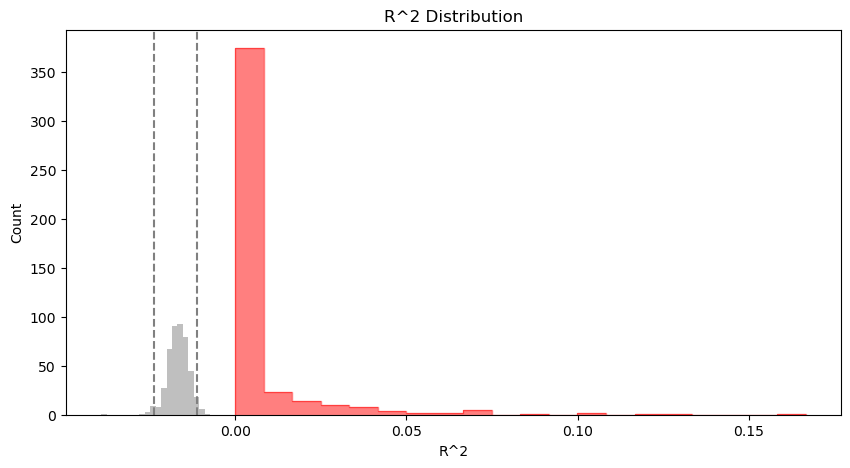

In [81]:
# plot score distribution
plt.figure(figsize=(10,5))

# plot null distribution and 95% confidence interval
plt.hist(null_scores.mean(axis=1), bins=20, alpha=0.5, label="Null", color="gray")
plt.axvline(np.quantile(null_scores.mean(axis=1), 0.025), color="gray", linestyle="--")
plt.axvline(np.quantile(null_scores.mean(axis=1), 0.975), color="gray", linestyle="--")

# plot neuron distribution
plt.hist(neuron_scores, bins=20, alpha=0.5, label="Neuron", color="red", histtype="step")
# show the ones that are significant
significant = neuron_scores[neuron_scores > np.quantile(null_scores.mean(axis=1), 0.975)]
plt.hist(significant, bins=20, alpha=0.5, label="Significant", color="red")


plt.xlabel("R^2")
plt.ylabel("Count")
plt.title("R^2 Distribution")
plt.show()

Sorted Idx::  [209   3 210  57  26 409 318 238 212 374 218 137 316   0  83 248 371 254
  28  60 241 385 320 126 216 322 436 313  42   4 429 373  39 337 321 237
 181 230 220 154 368 151  94 398 351 243 119 131  13 379 134 192  25 223
   1 415 114 222 437  14 390   6 125 215 156 244 366 292 372  27 200 229
 413 367 328 356 391 447 252 235 295   2 110 196 301  96 280 291 273  53
 249 205 299 427 101 370 186 290 387 260 325 255 207 423 444 396 147 364
 293  56 352  59  82   8 138 276 258 265 445 282  85 407 446 303 221 315
 342 158 198 233  19 335 204 213 424  32  24  38 169 116 157 184 388 340
 430 148  22  23 239 361 403 338 327  74 354 283 411 331 187 323 142 380
  65  84  69 140 378  30 189 277 302 245 381 345  11 395 332 167 123 418
  72 425 312 208 253 314 217  97  41 242  21 264 268 185 362 102 288 298
  15 124 139  99 180 211 224 127 438 375 334   7   9 164 145 431  47 306
 405 266 129 100 434 214 203 227 170  66 317  64 188  62 294 401 416 236
 251 261 111 284 432 369 112 109 226 

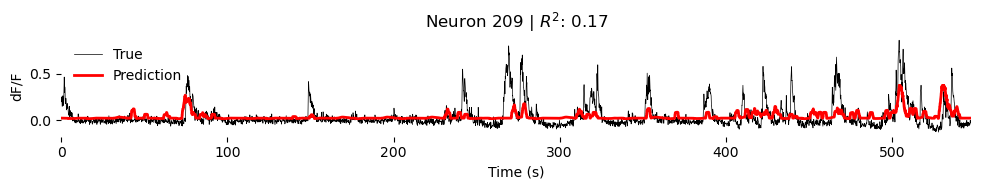

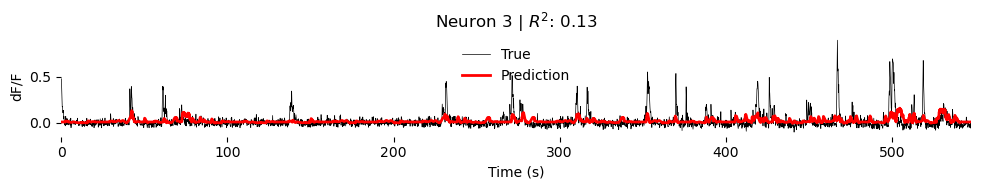

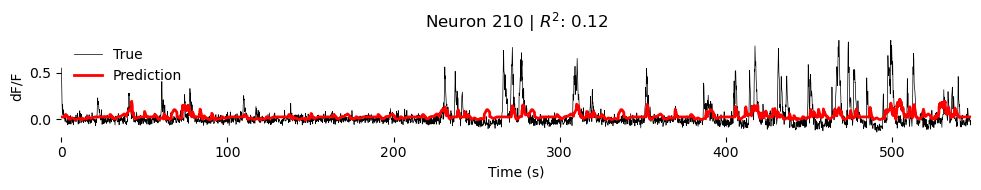

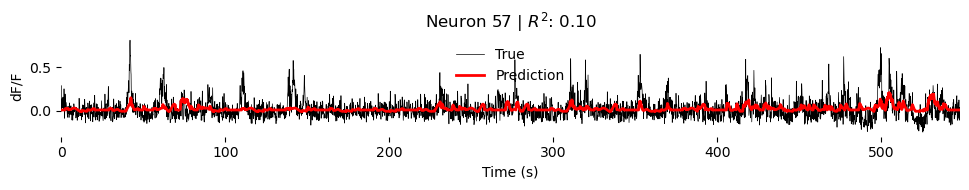

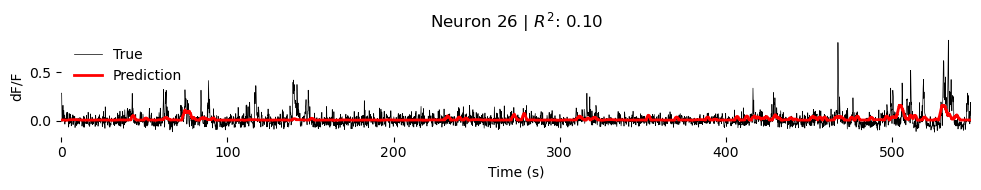

...

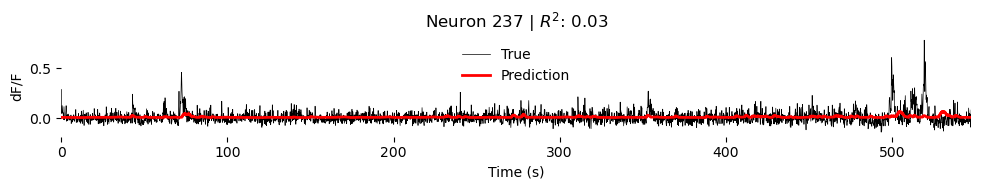

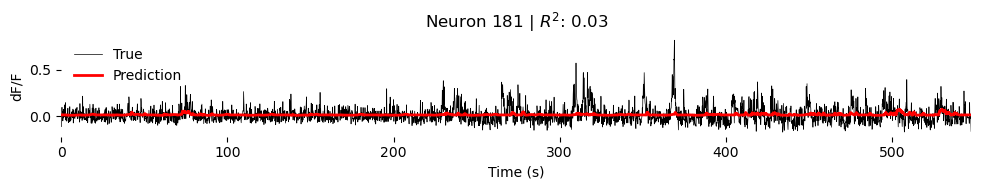

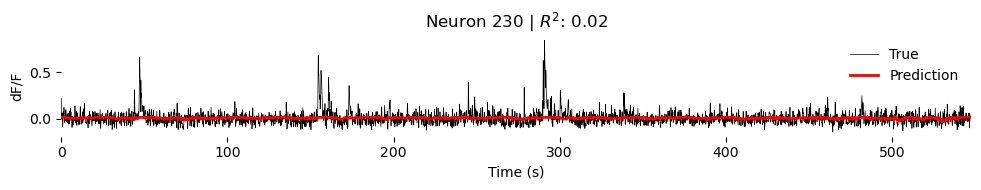

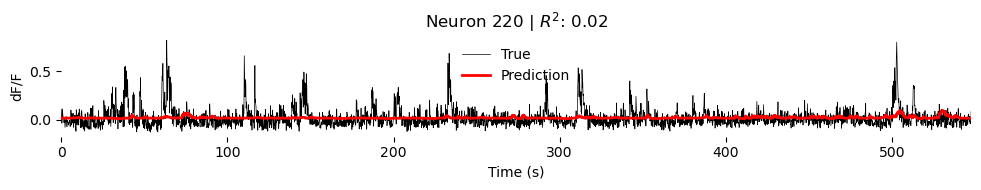

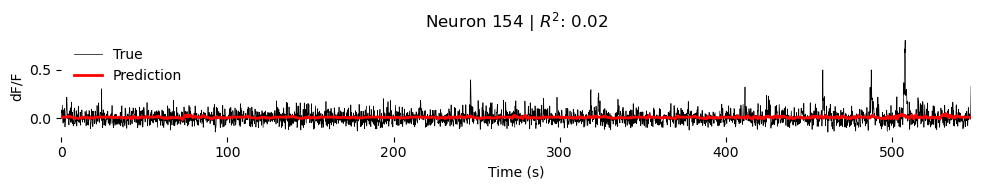

In [82]:
# sort by scores
sorted_idx = np.argsort(neuron_scores)[::-1]
sorted_dfof = np.array(ys)[sorted_idx, :]
sorted_models = np.array(neuron_models)[sorted_idx]
sorted_scores = neuron_scores[sorted_idx]
print("Sorted Idx:: ", sorted_idx)
# plot
for i in range(40):
    plt.figure(figsize=(10,2))
    plt.plot(time_series, sorted_dfof[i, :], label="True", color="black",linewidth=0.5)
    plt.plot(time_series, sorted_models[i].predict(X), label="Prediction", color="red",linewidth=2)
    plt.xlim(time_series[0], time_series[-1])
    plt.xlabel("Time (s)")
    plt.ylabel("dF/F")
    plt.title(r"Neuron {} | $R^2$: {:.2f}".format(sorted_idx[i], sorted_scores[i].mean()))
    plt.legend(frameon=False)
    plt.tight_layout()
    plt.box(False)
    plt.show()

[5.33758458e-03 9.58163331e-02 1.86084787e-02 1.82928087e-03
 5.85036416e-04 6.14271266e-03 4.00438810e-02 8.31636693e-01] 8


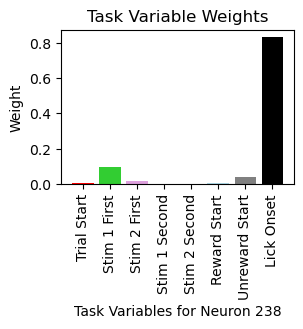

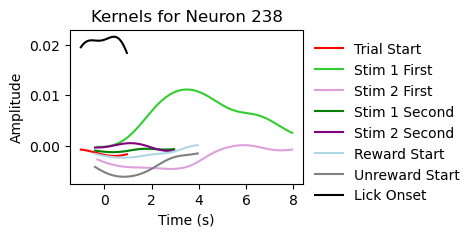

[0.03416225 0.03719746 0.01182304 0.02901673 0.49698377 0.31132303
 0.01608944 0.06340428] 8


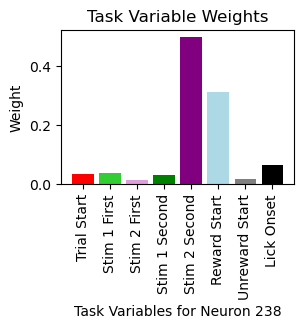

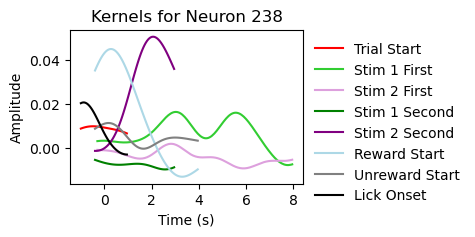

[0.04647918 0.04628141 0.07037023 0.06302295 0.63100183 0.09053009
 0.01406141 0.03825291] 8


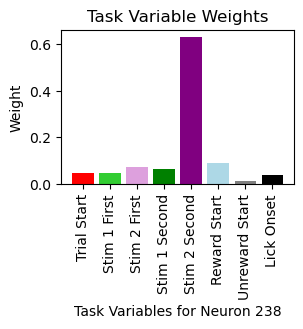

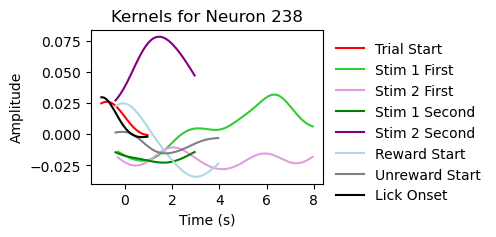

[0.07653114 0.02966904 0.05623754 0.03648962 0.64846425 0.08410465
 0.02005019 0.04845356] 8


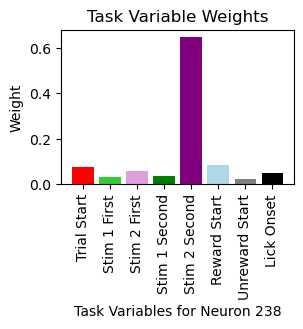

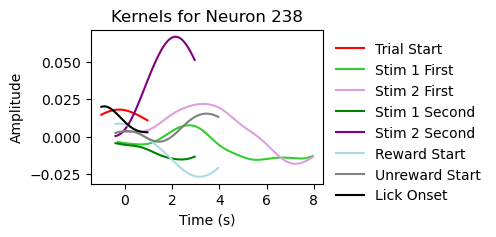

[0.03988318 0.00851418 0.07060568 0.00633661 0.01302722 0.00401213
 0.01671533 0.84090566] 8


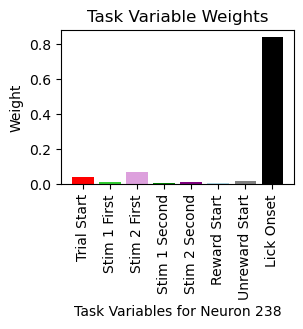

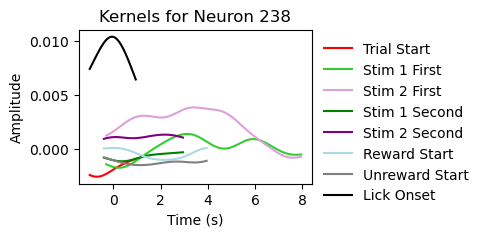

[0.00219637 0.02144042 0.00687852 0.06400574 0.11937874 0.00416622
 0.02291604 0.75901795] 8


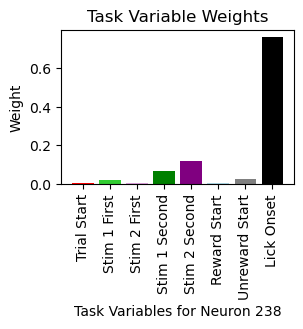

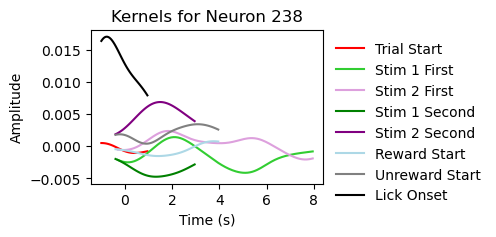

[0.06460612 0.0049031  0.03975008 0.0052365  0.28640423 0.00164719
 0.05939129 0.53806148] 8


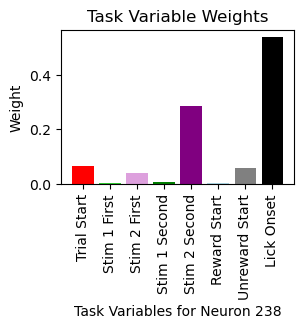

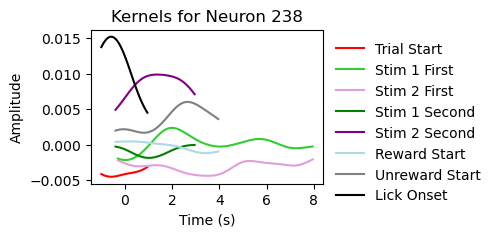

[0.12634108 0.02177188 0.02178295 0.02040786 0.73062342 0.02694212
 0.02294565 0.02918504] 8


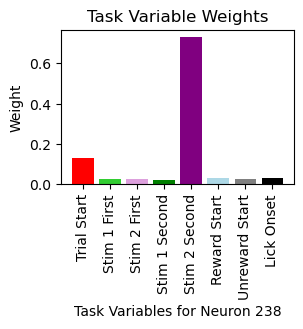

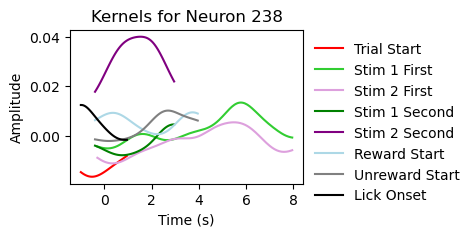

[0.00817638 0.13477563 0.08116877 0.00086305 0.00232297 0.0172762
 0.19149796 0.56391904] 8


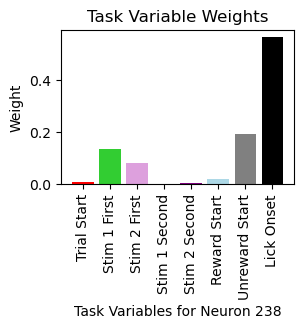

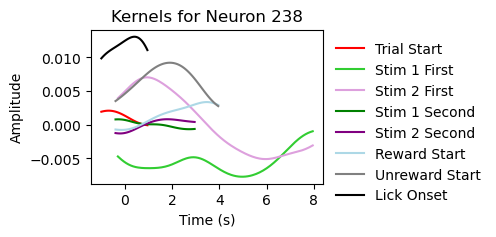

[0.01288513 0.10935752 0.05562836 0.59503931 0.03871059 0.0073699
 0.17565496 0.00535424] 8


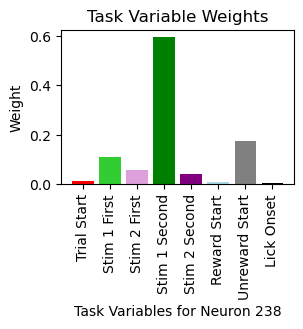

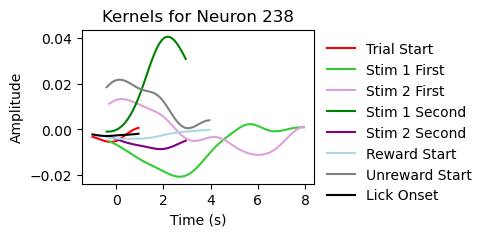

[0.00640502 0.10877437 0.05219833 0.06813753 0.06880511 0.02842114
 0.01713278 0.65012572] 8


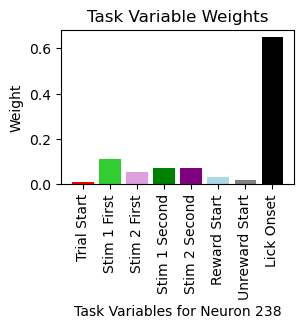

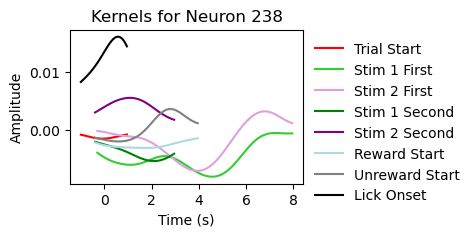

[1.40058051e-04 1.27655244e-02 2.95572374e-02 4.15979418e-02
 3.39735787e-01 4.20513444e-02 3.81178494e-02 4.96034257e-01] 8


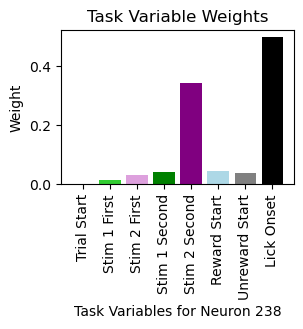

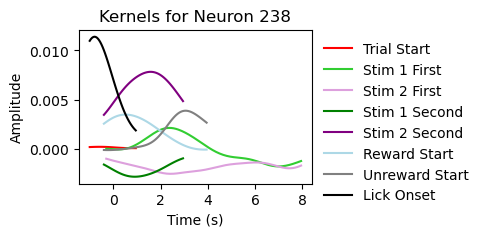

[0.04512385 0.0393493  0.00686477 0.00087675 0.25872288 0.01210756
 0.0330273  0.60392758] 8


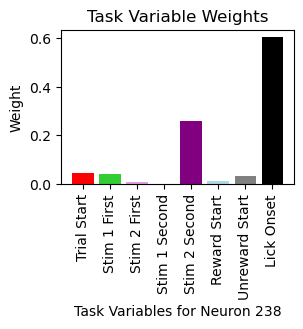

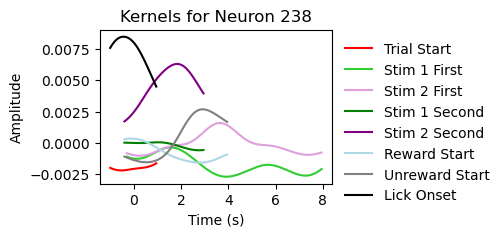

[0.02522436 0.01665177 0.02748413 0.09108147 0.21453029 0.0181108
 0.02838408 0.57853311] 8


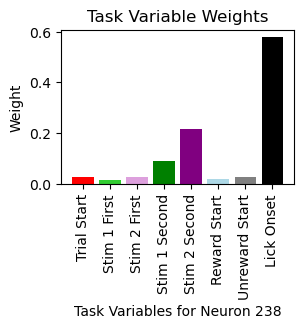

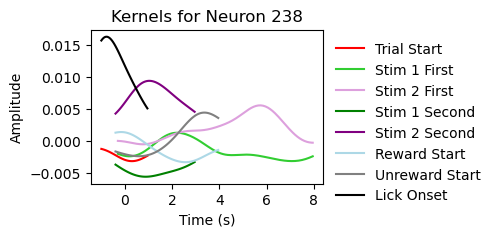

[0.09287587 0.03950397 0.01750152 0.03712627 0.30831949 0.01390255
 0.02719735 0.46357298] 8


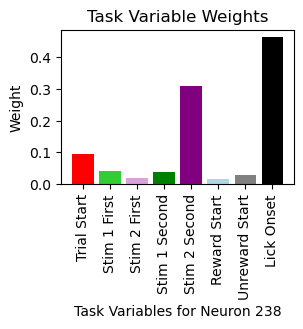

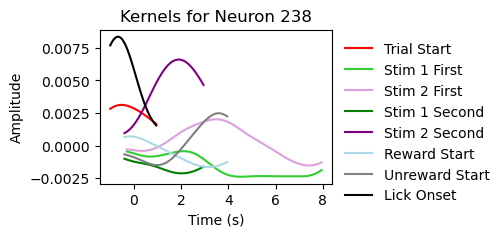

[0.03147253 0.14959358 0.07419963 0.11923391 0.00439354 0.00342341
 0.00459056 0.61309283] 8


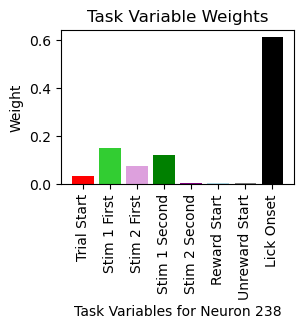

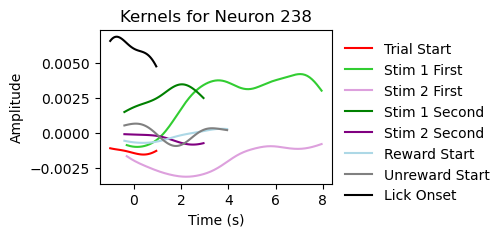

[0.01033847 0.07153073 0.01878891 0.02407953 0.06986616 0.0686043
 0.02614223 0.71064967] 8


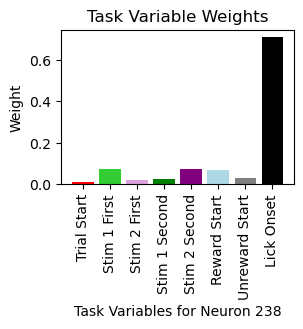

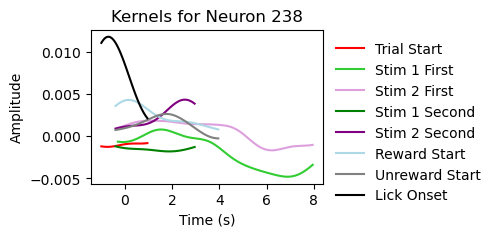

[0.00209426 0.00952858 0.03250292 0.10245503 0.05430904 0.05358489
 0.15149894 0.59402634] 8


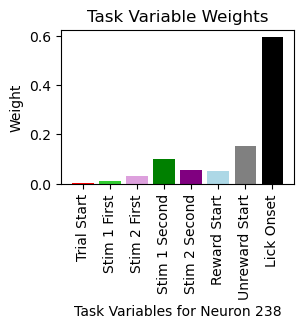

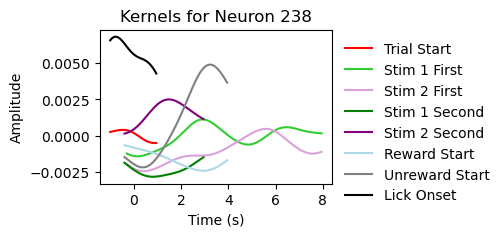

[1.93149350e-02 3.37017721e-02 9.00033863e-03 2.80227255e-02
 2.34412516e-04 7.73905378e-02 4.01159794e-02 7.92219299e-01] 8


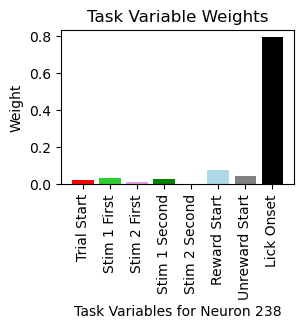

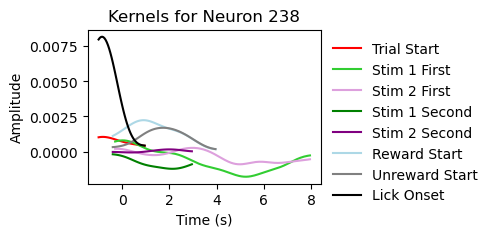

[0.00754815 0.09919424 0.02998755 0.11251334 0.16839908 0.02048178
 0.06483909 0.49703677] 8


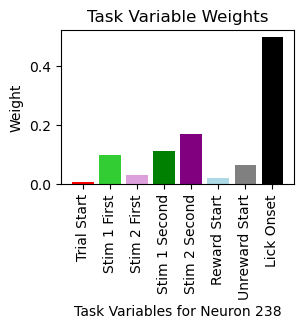

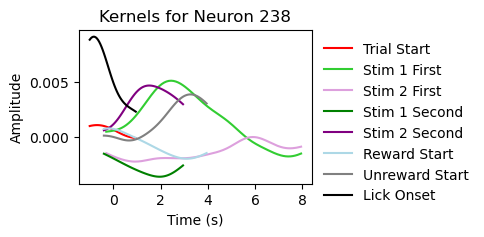

[0.002041   0.00237092 0.00232297 0.00118363 0.00278099 0.00899174
 0.00145812 0.97885063] 8


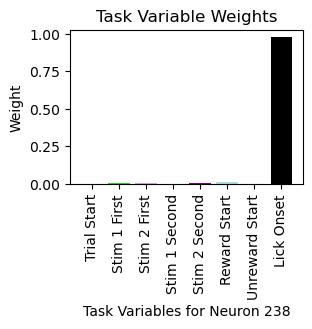

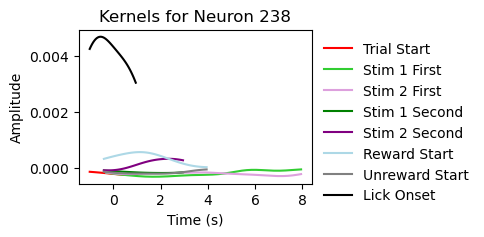

[3.11200229e-03 7.71801150e-04 5.19219317e-03 7.65223134e-04
 2.63626103e-04 8.30884293e-04 4.31784753e-04 9.88632485e-01] 8


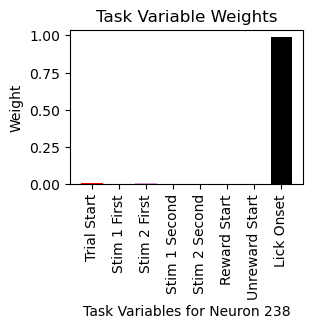

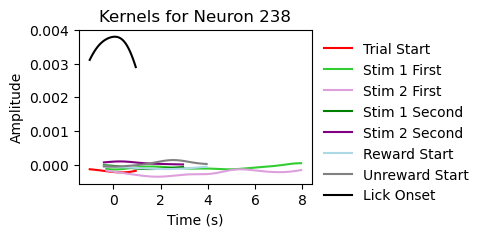

[1.13630232e-03 5.19864310e-04 5.14019963e-04 1.27231479e-03
 1.48126627e-03 4.88260016e-04 1.74380605e-03 9.92844166e-01] 8


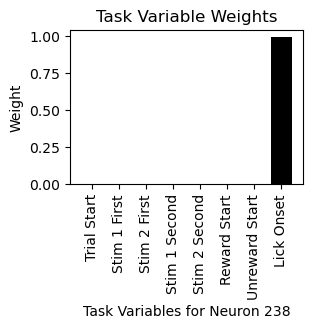

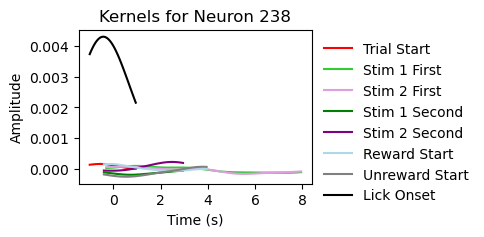

[1.90690033e-03 3.26083184e-03 8.66135749e-04 7.40762584e-04
 3.75460609e-03 2.48841102e-03 1.48987471e-02 9.72083605e-01] 8


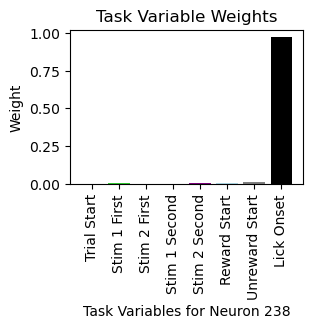

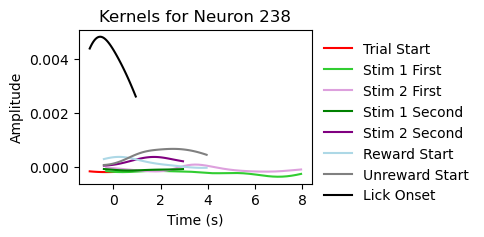

[7.81226440e-05 2.77104025e-03 1.81782375e-02 1.19980311e-03
 3.37957415e-03 1.02423852e-03 5.55641785e-03 9.67812566e-01] 8


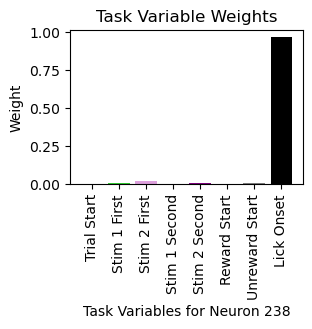

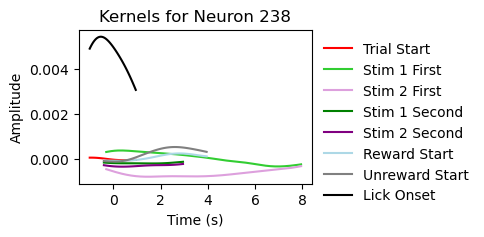

[0.02230757 0.19205588 0.01534703 0.06669966 0.2023226  0.04625302
 0.13650683 0.31850741] 8


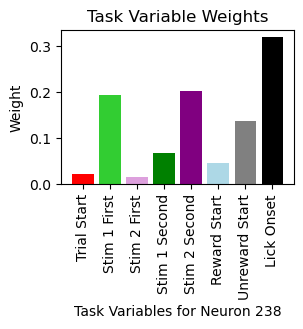

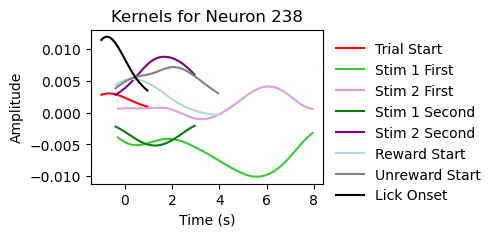

[3.47898385e-04 3.08674248e-03 2.27688368e-03 3.23664126e-04
 2.04787600e-04 8.13851022e-04 4.79661013e-03 9.88149563e-01] 8


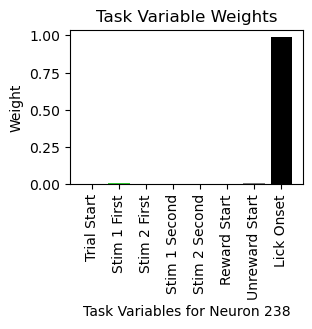

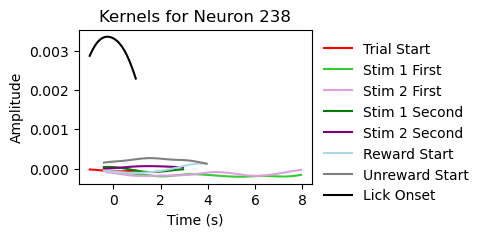

[1.24388290e-03 5.10847219e-03 3.70926164e-03 5.26167040e-04
 1.77132990e-03 4.42314450e-03 4.26381149e-04 9.82791361e-01] 8


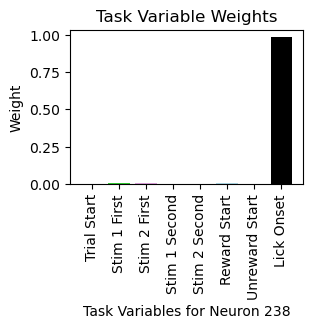

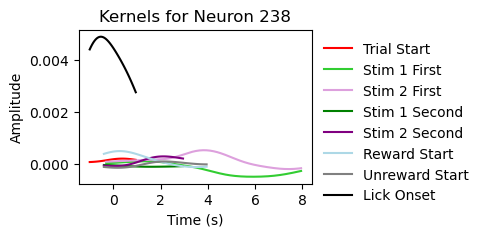

[0.0762839  0.04927575 0.02915436 0.02081655 0.00165834 0.40810429
 0.01229813 0.40240868] 8


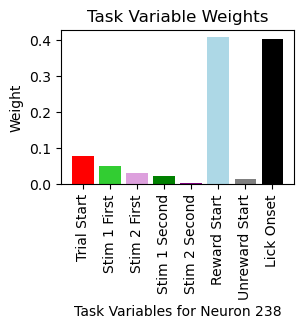

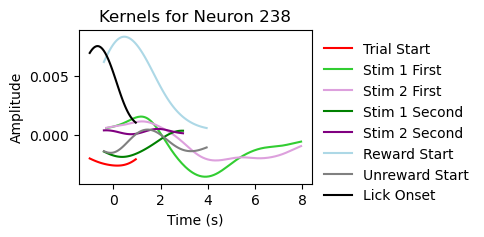

[2.60975959e-03 2.88941938e-03 1.09771609e-02 3.59736434e-04
 2.53032821e-03 1.00069255e-03 7.04488302e-03 9.72588020e-01] 8


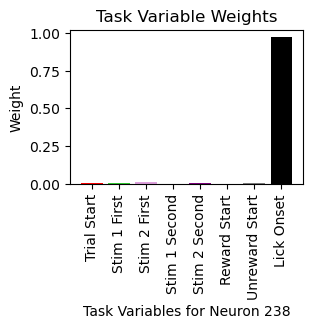

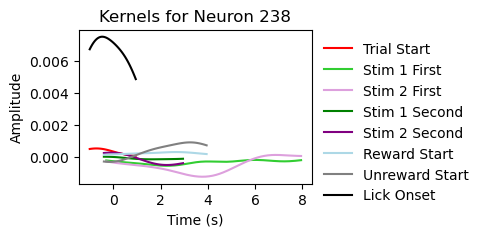

[0.03858354 0.04484489 0.15715091 0.57939989 0.07353219 0.01370645
 0.09040872 0.00237342] 8


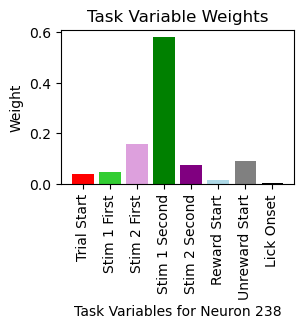

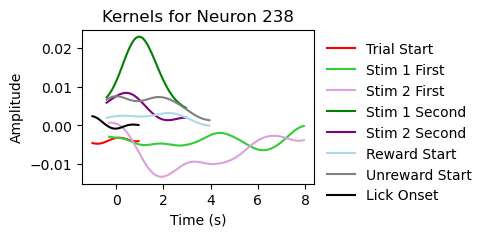

[0.04887762 0.08953255 0.08687728 0.05636448 0.03713482 0.0336062
 0.08382256 0.56378448] 8


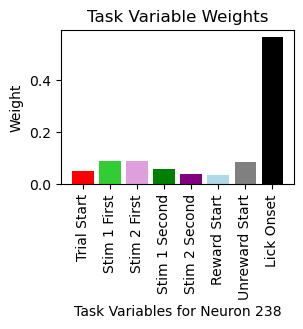

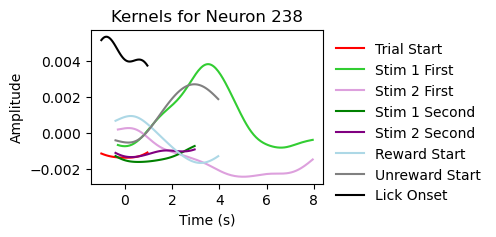

[5.10866432e-05 9.93260722e-03 1.79627886e-03 1.76701364e-03
 1.54217733e-02 1.13838601e-03 5.21900908e-04 9.69370953e-01] 8


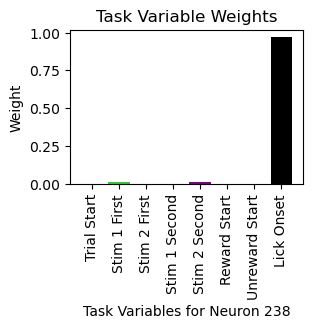

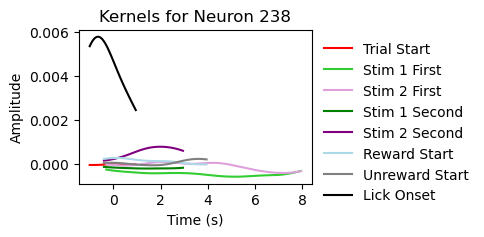

[0.00378622 0.3669605  0.02292025 0.00313911 0.07074915 0.02563596
 0.0614054  0.44540341] 8


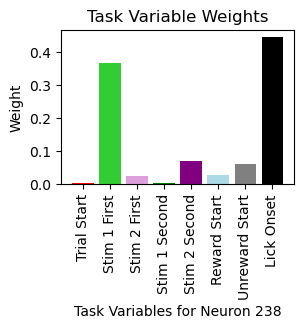

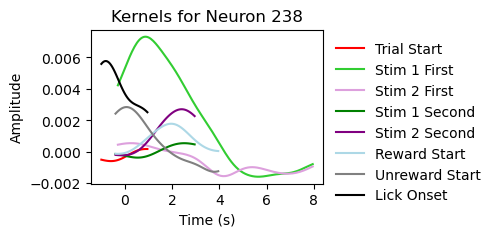

[0.22295693 0.00602926 0.01761202 0.066182   0.01405983 0.02670448
 0.05340178 0.5930537 ] 8


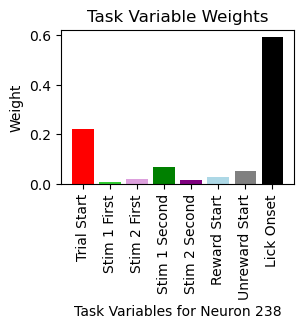

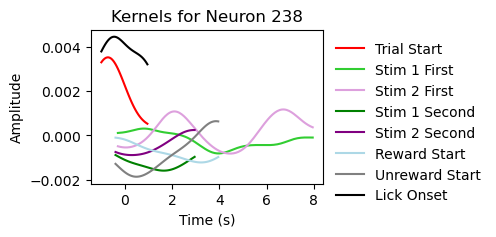

[0.01198391 0.26257513 0.04820816 0.04543228 0.08827635 0.07775135
 0.04253636 0.42323646] 8


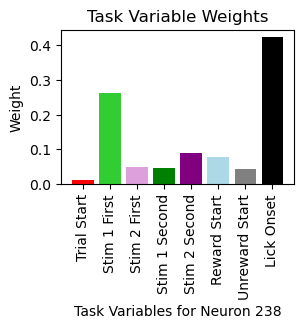

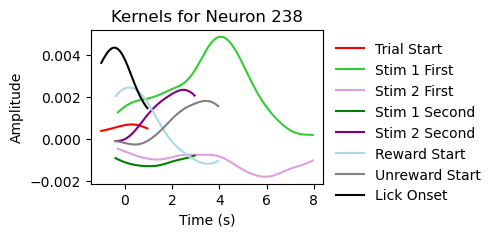

[0.04364558 0.02737918 0.13248752 0.09339086 0.15986837 0.00804705
 0.28792522 0.24725622] 8


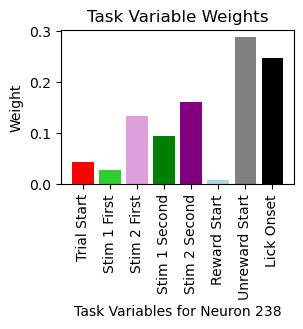

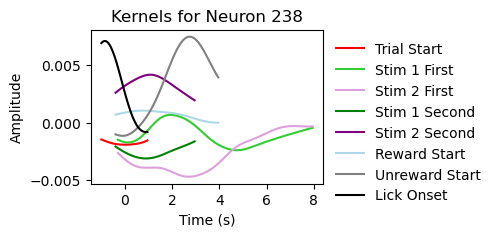

[0.05931961 0.30355177 0.2721032  0.11301107 0.1591045  0.01406639
 0.06449973 0.01434373] 8


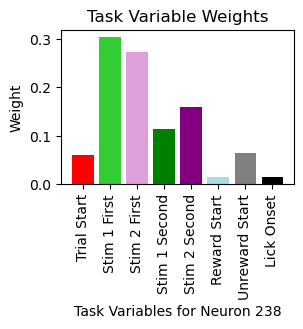

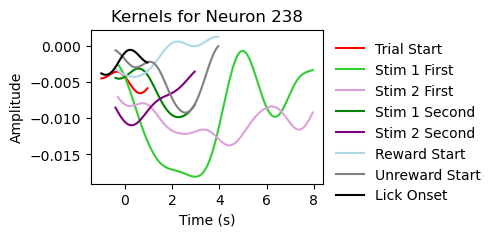

[0.00283226 0.13816421 0.32923589 0.00124386 0.01553571 0.17304839
 0.04287395 0.29706574] 8


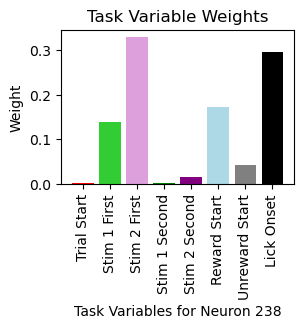

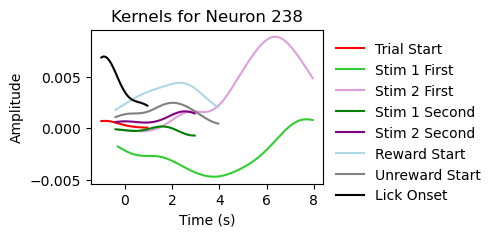

[0.0274947  0.11012447 0.31462464 0.04577372 0.10507017 0.07765288
 0.26842544 0.05083398] 8


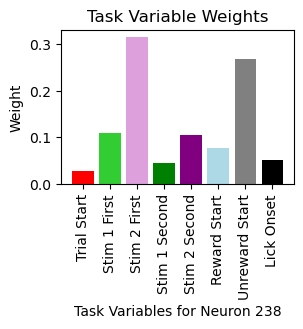

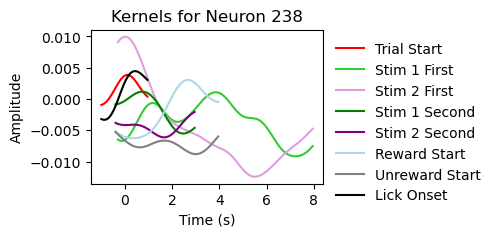

In [88]:
for i,model in enumerate(sorted_models[:40]):
    task_weights = []
    coefs = model.coef_
    all_coefs = []
    kernel_idx = 0
    for i in [x.shape[1] for x in all_kernels]:
        coef = coefs[kernel_idx:kernel_idx+i]
        all_coefs.append(coef)
        kernel_idx += i
    # calculate kernels
    kernels = []
    for i in range(len(all_coefs)):
        kernel = all_kernels[i]
        regression_timeseries = regression_timeserieses[i]
        net_kernel = np.zeros_like(regression_timeseries)
        for j in range(kernel.shape[1]):
            net_kernel += kernel[:, j] * all_coefs[i][j]
        kernels.append(net_kernel)
    # calculate task weights
    task_weights = []
    for i in range(len(kernels)):
        task_weights.append(np.mean(kernels[i]**2))
    # normalize
    task_weights = np.array(task_weights)
    task_weights = task_weights/task_weights.sum()
    print(task_weights,len(task_variable_names))
                            
    plt.figure(figsize=(3,2))
    plt.bar(np.arange(len(task_variable_names)), task_weights, color=task_colors)
    plt.xlabel('Task Variables for Neuron {}'.format(sorted_idx[i]))
    plt.xticks(np.arange(len(task_variable_names)), task_variable_names, rotation=90)
    plt.ylabel('Weight')
    plt.title('Task Variable Weights')
    plt.show()
    # plot all coefs
    plt.figure(figsize=(3,2))
    for i in range(len(all_coefs)):
        kernels = all_kernels[i]
        regression_timeseries = regression_timeserieses[i]
        net_kernel = np.zeros_like(regression_timeseries)
        for j in range(kernels.shape[1]):
            net_kernel += kernels[:, j] * all_coefs[i][j]
        plt.plot(regression_timeseries, net_kernel, label=task_variable_names[i], color=task_colors[i])
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title("Kernels for Neuron {}".format(sorted_idx[i]))
    plt.legend(frameon=False,bbox_to_anchor=(1,1))
    plt.show()
    


In [121]:
recalculation = True

if recalculation or not (os.path.exists("neuron_models.pkl") and os.path.exists("neuron_scores.pkl")):
    neuron_models = []
    neuron_scores = []
    for y in tqdm(ys):
        # perform Linear Regression with 5-fold cross validation
        model = ElasticNetCV(alphas=np.logspace(-6, 6, 13), cv=5, max_iter=1e6)
        # fit model
        model.fit(X, y)
        # # print coefficients
        # print("Best Alpha: ", model.alpha_)
        # print("Best Coefficients: ", model.coef_)
        # get best model
        model = ElasticNet(alpha=model.alpha_)
        model.fit(X, y)
        neuron_models.append(model)
        neuron_scores.append(model.score(X, y))
        
        # scores = []
        # models = []
        # for train_index, test_index in kf.split(X):
        #     X_train, X_test = X[train_index], X[test_index]
        #     y_train, y_test = y[train_index], y[test_index]
        #     model.fit(X_train, y_train)
        #     models.append(model)
        #     scores.append(model.score(X, y))
        # # create average model
        # model = ElasticNet(l1_ratio=model.l1_ratio_, alpha=model.alpha_)
        # model.coef_ = np.array([x.coef_ for x in models]).mean(axis=0)
        # model.intercept_ = np.array([x.intercept_ for x in models]).mean()
        # neuron_models.append(model)
        # neuron_scores.append(scores)
    neuron_scores = np.array(neuron_scores)

#     # save models and scores
#     with open("neuron_models.pkl", "wb") as f:
#         pickle.dump(neuron_models, f)
#     with open("neuron_scores.pkl", "wb") as f:
#         pickle.dump(neuron_scores, f)
# else:
#     with open("neuron_models.pkl", "rb") as f:
#         neuron_models = pickle.load(f)
#     with open("neuron_scores.pkl", "rb") as f:
#         neuron_scores = pickle.load(f)

  0%|          | 0/448 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [85]:
regression_range = (-10, 1)
regression_timeseries = np.arange(regression_range[0], regression_range[1], resolution)
print("Regression Time Series Shape: ", regression_timeseries.shape)
n_before = np.sum(regression_timeseries < 0)
n_after = np.sum(regression_timeseries >= 0)
print("Before: ", n_before, " After: ", n_after)

# generate design matrix
X_design, y_design = [], []
for t in range(len(time_series)):

    X = np.zeros((regression_timeseries.shape[0], task_variables.shape[1]))
    how_many_before = task_variables[max(0, t-n_before):t, :].shape[0]
    how_many_after = task_variables[t:min(task_variables.shape[0], t+n_after), :].shape[0]
    X[n_before-how_many_before:n_before, :] = task_variables[max(0, t-n_before):t, :]
    X[n_before:n_before+how_many_after, :] = task_variables[t:min(task_variables.shape[0], t+n_after), :]
    X_design.append(X.flatten())

    y = dfof[t]
    y_design.append(y)

X_design = np.array(X_design)
y_design = np.array(y_design)

print("X_design shape: ", X_design.shape)
print("y_design shape: ", y_design.shape)

# split into train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_design, y_design, test_size=0.2)

# fit linear regression, or MLP
from sklearn.linear_model import RidgeCV


model = RidgeCV(cv=5)
model.fit(X_train, y_train)

print("Train Score: ", model.score(X_train, y_train))
print("Test Score: ", model.score(X_test, y_test))

# reconstruct the time series
y_pred = model.predict(X_design)
plt.figure(figsize=(20,5))
plt.plot(time_series, dfof, label="Original")
plt.plot(time_series, y_pred, label="Reconstructed")
plt.legend()
plt.show()

coefs = model.coef_.reshape(regression_timeseries.shape[0], task_variables.shape[1])
print("Coefs shape: ", coefs.shape)

fig,ax = plt.subplots(task_variables.shape[1],1, figsize=(3, 3*task_variables.shape[1]), sharey=True)
for i in range(task_variables.shape[1]):
    ax[i].plot(regression_timeseries, coefs[:, i])
    ax[i].axvline(0, color="red")
    ax[i].set_xlabel("Time (s)")
    ax[i].set_ylabel("Coefficient")
    ax[i].set_title(task_variable_names[i])
plt.tight_layout()
plt.show()

Regression Time Series Shape:  (220,)
Before:  200  After:  20


IndexError: index 3402 is out of bounds for axis 0 with size 3402

Coefs shape:  (220, 9)


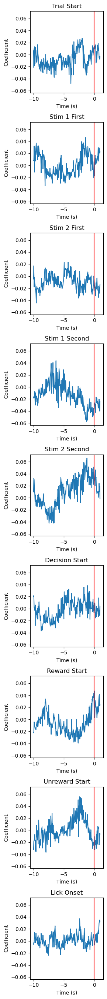